<img src="https://github.com/pmservice/ai-openscale-tutorials/raw/master/notebooks/images/banner.png" align="left" alt="banner">

# Tutorial on generating an explanation for an image-based model on Watson OpenScale

This notebook includes steps for creating an image-based watson-machine-learning model, creating a subscription, configuring explainability, and finally generating an explanation for a transaction.

### Contents
- [1. Setup](#setup)
- [2. Creating and deploying an image-based model](#deployment)
- [3. Subscriptions](#subscription)
- [4. Explainability](#explainability)

**Note**: This notebook is using runtime 'Default Python 3.7'

<a id="setup"></a>
## 1. Setup

### 1.1 Install Watson OpenScale and WML packages

In [1]:
!pip install --upgrade ibm-watson-openscale --no-cache | tail -n 1

In [2]:
!pip install --upgrade ibm-watson-machine-learning --no-cache | tail -n 1

Note: Restart the kernel to assure the new libraries are being used.

### 1.2 Configure credentials

Your Cloud API key can be generated by going to the [**Users** section of the Cloud console](https://cloud.ibm.com/iam#/users). From that page, click your name, scroll down to the **API Keys** section, and click **Create an IBM Cloud API key**. Give your key a name and click **Create**, then copy the created key and paste it below.

**NOTE:** You can also get OpenScale `API_KEY` using IBM CLOUD CLI.

How to install IBM Cloud (bluemix) console: [instruction](https://console.bluemix.net/docs/cli/reference/ibmcloud/download_cli.html#install_use)

How to get api key using console:
```
bx login --sso
bx iam api-key-create 'my_key'
```

In [3]:
CLOUD_API_KEY = "wqMwzhQ7GRNBlH5iS3OVGlf3Ym4OD4EPJjaA6Eg8mQgg"
IAM_URL="https://iam.ng.bluemix.net/oidc/token"

In [4]:
WML_CREDENTIALS = {
                   "url": "https://us-south.ml.cloud.ibm.com",
                   "apikey": CLOUD_API_KEY
}

<a id="deployment"></a>
## 2. Creating and deploying an image-based model

The dataset used is MNIST dataset of handwritten digits. It consists of 60,000 28x28 grayscale images of the 10 digits, along with a test set of 10,000 images. More information about the dataset can be found here: https://keras.io/datasets/#mnist-database-of-handwritten-digits

Note: Keras and TensorFlow versions supported by WML are: Keras 2.1.6 with TensorFlow 1.13 backend and Keras 2.2.4 with TensorFlow 1.14 backend. The latter combination is used in this notebook.

### 2.1 Creating a model

In [5]:
!pip install keras==2.2.5
!pip install tensorflow==1.15.0
!pip install keras_sequential_ascii

import keras
from keras.datasets import mnist
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras_sequential_ascii import sequential_model_to_ascii_printout
from keras import backend as keras_backend
print(keras.__version__)

Using TensorFlow backend.


2.2.5


In [6]:
batch_size = 128
num_classes = 10
epochs = 5

In [7]:
# input image dimensions
img_rows, img_cols = 28, 28

# the data, split between train and test sets
(x_train, y_train), (x_test, y_test) = mnist.load_data()

if keras_backend.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_test = x_test.reshape(x_test.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_test = x_test.reshape(x_test.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)

x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255
x_test /= 255

print('x_train shape:', x_train.shape)
print(x_train.shape[0], 'train samples')
print(x_test.shape[0], 'test samples')

11493376/11490434 [==============================] - 0s 0us/step
x_train shape: (60000, 28, 28, 1)
60000 train samples
10000 test samples


In [8]:
# convert class vectors to binary class matrices
y_train = keras.utils.to_categorical(y_train, num_classes)
y_test = keras.utils.to_categorical(y_test, num_classes)

In [9]:
# Define Model

def base_model():
    model = Sequential()
    model.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=input_shape))
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))
    model.add(Flatten())
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(num_classes, activation='softmax'))

    model.compile(loss=keras.losses.categorical_crossentropy,
                  optimizer=keras.optimizers.Adadelta(),
                  metrics=['accuracy'])
    return model

In [10]:
cnn_n = base_model()
cnn_n.summary()






Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 26, 26, 32)        320       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 24, 24, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 12, 12, 64)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 12, 12, 64)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 9216)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 128)               1179776  

In [11]:
# Vizualizing model structure
sequential_model_to_ascii_printout(cnn_n)

           OPERATION           DATA DIMENSIONS   WEIGHTS(N)   WEIGHTS(%)

               Input   #####     28   28    1
              Conv2D    \|/  -------------------       320     0.0%
                relu   #####     26   26   32
              Conv2D    \|/  -------------------     18496     1.5%
                relu   #####     24   24   64
        MaxPooling2D   Y max -------------------         0     0.0%
                       #####     12   12   64
             Dropout    | || -------------------         0     0.0%
                       #####     12   12   64
             Flatten   ||||| -------------------         0     0.0%
                       #####        9216
               Dense   XXXXX -------------------   1179776    98.3%
                relu   #####         128
             Dropout    | || -------------------         0     0.0%
                       #####         128
               Dense   XXXXX -------------------      1290     0.1%
             softmax   ##### 

In [12]:
# Fit model
print(y_train.shape)
cnn = cnn_n.fit(x_train, y_train, batch_size=batch_size, epochs=epochs, validation_data=(x_test, y_test))

(60000, 10)
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where



Train on 60000 samples, validate on 10000 samples
Epoch 1/5





60000/60000 [==============================] - 229s 4ms/step - loss: 0.2655 - acc: 0.9201 - val_loss: 0.0599 - val_acc: 0.9808
Epoch 2/5
60000/60000 [==============================] - 218s 4ms/step - loss: 0.0886 - acc: 0.9732 - val_loss: 0.0385 - val_acc: 0.9872
Epoch 3/5
60000/60000 [==============================] - 218s 4ms/step - loss: 0.0654 - acc: 0.9805 - val_loss: 0.0367 - val_acc: 0.9868
Epoch 4/5
60000/60000 [==============================] - 218s 4ms/step - loss: 0.0554 - acc: 0.9830 - val_loss: 0.0325 - val_acc: 0.9889
Epoch 5/5
60000/60000 [==============================] - 220s 4ms/step - loss: 0.0462 - acc: 0.9861 - val_loss: 0.0302 - val_acc: 0.9897


In [13]:
scores = cnn_n.evaluate(x_test, y_test, verbose=0)
print(scores)
print("Accuracy: %.2f%%" % (scores[1]*100))

[0.030172283345837787, 0.9897]
Accuracy: 98.97%


In [14]:
cnn_n.save("mnist_cnn.h5")
!rm mnist_cnn.tar*
!tar -czvf mnist_cnn.tar.gz mnist_cnn.h5

rm: cannot remove 'mnist_cnn.tar*': No such file or directory
mnist_cnn.h5


In [15]:
from IPython.display import HTML
import base64
import io

def create_download_link_for_ddm( title = "Download model zip", filename = "mnist_cnn.tar.gz"):  
    
    #Retains stats information    

    with open(filename,'rb') as file:
        ddm = file.read()
    b64 = base64.b64encode(ddm)
    payload = b64.decode()

    html = '<a download="{filename}" href="data:text/json;base64,{payload}" target="_blank">{title}</a>'
    html = html.format(payload=payload,title=title,filename=filename)
    return HTML(html)


create_download_link_for_ddm()

### 2.2 Storing the model

In [16]:
import json
from ibm_watson_machine_learning import APIClient

wml_client = APIClient(WML_CREDENTIALS)
wml_client.version

'1.0.38'

In [17]:
wml_client.spaces.list(limit=10)

------------------------------------  --------------  ------------------------
ID                                    NAME            CREATED
7fb100d2-bfb3-40f6-8a61-9daf733a16aa  prod-space      2020-10-26T22:28:31.105Z
4892166c-6285-47f8-9f3f-b9c3c541a4a2  pre-prod-space  2020-10-26T21:25:32.230Z
a2c5ddbd-c002-4c86-ab07-ce7334fbfa4d  test_v4         2020-09-30T19:38:26.229Z
------------------------------------  --------------  ------------------------


In [18]:
WML_SPACE_ID='a2c5ddbd-c002-4c86-ab07-ce7334fbfa4d' # use space id here
wml_client.set.default_space(WML_SPACE_ID)

'SUCCESS'

In [20]:
MODEL_NAME = "MNIST Model"

In [21]:
software_spec_uid = wml_client.software_specifications.get_id_by_name("tensorflow_1.15-py3.6")
print("Software Specification ID: {}".format(software_spec_uid))
model_props = {
        wml_client._models.ConfigurationMetaNames.NAME:"{}".format(MODEL_NAME),
        wml_client._models.ConfigurationMetaNames.SPACE_UID: WML_SPACE_ID,
        wml_client._models.ConfigurationMetaNames.TYPE: "keras_2.2.5",
        wml_client._models.ConfigurationMetaNames.SOFTWARE_SPEC_UID: software_spec_uid,
    }

Software Specification ID: 2b73a275-7cbf-420b-a912-eae7f436e0bc


In [22]:
print("Storing model ...")
published_model_details = wml_client.repository.store_model(
    model='mnist_cnn.tar.gz', 
    meta_props=model_props, 
)

model_uid = wml_client.repository.get_model_uid(published_model_details)
print("Done")
print("Model ID: {}".format(model_uid))

Storing model ...
Done
Model ID: e5eb2143-3310-4971-8ac1-a36aa69de0aa


### 2.3 Deploying the model

In [23]:
deployment_details = wml_client.deployments.create(
    model_uid, 
    meta_props={
        wml_client.deployments.ConfigurationMetaNames.NAME: "{}".format(MODEL_NAME + " deployment"),
        wml_client.deployments.ConfigurationMetaNames.ONLINE: {}
    }
)
scoring_url = wml_client.deployments.get_scoring_href(deployment_details)
deployment_uid=wml_client.deployments.get_uid(deployment_details)

print("Scoring URL:" + scoring_url)
print("Model id: {}".format(model_uid))
print("Deployment id: {}".format(deployment_uid))



#######################################################################################

Synchronous deployment creation for uid: 'e5eb2143-3310-4971-8ac1-a36aa69de0aa' started

#######################################################################################


initializing.
ready


------------------------------------------------------------------------------------------------
Successfully finished deployment creation, deployment_uid='e10f5a96-aa8d-494e-a3b1-08cd58521eec'
------------------------------------------------------------------------------------------------


Scoring URL:https://us-south.ml.cloud.ibm.com/ml/v4/deployments/e10f5a96-aa8d-494e-a3b1-08cd58521eec/predictions
Model id: e5eb2143-3310-4971-8ac1-a36aa69de0aa
Deployment id: e10f5a96-aa8d-494e-a3b1-08cd58521eec


## 3. Subscriptions <a id="subscriptions"></a>

### 3.1 Configuring OpenScale

In [24]:
from ibm_cloud_sdk_core.authenticators import IAMAuthenticator,BearerTokenAuthenticator

from ibm_watson_openscale import *
from ibm_watson_openscale.supporting_classes.enums import *
from ibm_watson_openscale.supporting_classes import *


authenticator = IAMAuthenticator(apikey=CLOUD_API_KEY)
#authenticator = BearerTokenAuthenticator(bearer_token=IAM_TOKEN) ## uncomment this line if using IAM token to authenticate
wos_client = APIClient(authenticator=authenticator)
wos_client.version

'3.0.2'

In [25]:
#DB_CREDENTIALS= {"hostname":"","username":"","password":"","database":"","port":"","ssl":True,"sslmode":"","certificate_base64":""}
DB_CREDENTIALS = None
KEEP_MY_INTERNAL_POSTGRES = True

In [26]:
data_marts = wos_client.data_marts.list().result.data_marts
if len(data_marts) == 0:
    if DB_CREDENTIALS is not None:
        if SCHEMA_NAME is None: 
            print("Please specify the SCHEMA_NAME and rerun the cell")

        print('Setting up external datamart')
        added_data_mart_result = wos_client.data_marts.add(
                background_mode=False,
                name="WOS Data Mart",
                description="Data Mart created by WOS tutorial notebook",
                database_configuration=DatabaseConfigurationRequest(
                  database_type=DatabaseType.POSTGRESQL,
                    credentials=PrimaryStorageCredentialsLong(
                        hostname=DB_CREDENTIALS['hostname'],
                        username=DB_CREDENTIALS['username'],
                        password=DB_CREDENTIALS['password'],
                        db=DB_CREDENTIALS['database'],
                        port=DB_CREDENTIALS['port'],
                        ssl=True,
                        sslmode=DB_CREDENTIALS['sslmode'],
                        certificate_base64=DB_CREDENTIALS['certificate_base64']
                    ),
                    location=LocationSchemaName(
                        schema_name= SCHEMA_NAME
                    )
                )
             ).result
    else:
        print('Setting up internal datamart')
        added_data_mart_result = wos_client.data_marts.add(
                background_mode=False,
                name="WOS Data Mart",
                description="Data Mart created by WOS tutorial notebook", 
                internal_database = True).result
        
    data_mart_id = added_data_mart_result.metadata.id
    
else:
    data_mart_id=data_marts[0].metadata.id
    print('Using existing datamart {}'.format(data_mart_id))

Using existing datamart 5a0b9076-fcf6-49e8-a824-9e3a6b4c2a56


In [27]:
SERVICE_PROVIDER_NAME = "Watson Machine Learning V2_test"
SERVICE_PROVIDER_DESCRIPTION = "Added by tutorial WOS notebook."

In [28]:
service_providers = wos_client.service_providers.list().result.service_providers
for service_provider in service_providers:
    service_instance_name = service_provider.entity.name
    if service_instance_name == SERVICE_PROVIDER_NAME:
        service_provider_id = service_provider.metadata.id
        wos_client.service_providers.delete(service_provider_id)
        print("Deleted existing service_provider for WML instance: {}".format(service_provider_id))

Deleted existing service_provider for WML instance: 59d3a7f1-3ee6-484e-a472-a947a82868eb


In [29]:
added_service_provider_result = wos_client.service_providers.add(
        name=SERVICE_PROVIDER_NAME,
        description=SERVICE_PROVIDER_DESCRIPTION,
        service_type=ServiceTypes.WATSON_MACHINE_LEARNING,
        deployment_space_id = WML_SPACE_ID,
        operational_space_id = "production",
        credentials=WMLCredentialsCloud(
            apikey=CLOUD_API_KEY,      ## use `apikey=IAM_TOKEN` if using IAM_TOKEN to initiate client
            url=WML_CREDENTIALS["url"],
            instance_id=None
        ),
        background_mode=False
    ).result
service_provider_id = added_service_provider_result.metadata.id




 Waiting for end of adding service provider a781a8de-d3b8-4f55-bb8b-6ceb393c47de 




active

-----------------------------------------------
 Successfully finished adding service provider 
-----------------------------------------------




In [30]:
asset_deployment_details_list = wos_client.service_providers.list_assets(data_mart_id=data_mart_id, service_provider_id=service_provider_id, deployment_space_id = WML_SPACE_ID).result['resources']
DEPLOYMENT_NAME=MODEL_NAME + " deployment" # use the model name here 
asset_deployment_details = [asset for asset in asset_deployment_details_list if asset['entity']["name"]==DEPLOYMENT_NAME]

if len(asset_deployment_details)>0:
    [asset_deployment_details] = asset_deployment_details
else:
    raise ValueError('deployment with name "{}" not found.'.format(DEPLOYMENT_NAME))
asset_deployment_details

{'metadata': {'guid': 'e10f5a96-aa8d-494e-a3b1-08cd58521eec',
  'url': 'https://us-south.ml.cloud.ibm.com/ml/v4/deployments/e10f5a96-aa8d-494e-a3b1-08cd58521eec?space_id=a2c5ddbd-c002-4c86-ab07-ce7334fbfa4d',
  'created_at': '2020-11-04T23:23:03.991Z',
  'modified_at': '2020-11-04T23:23:03.991Z'},
 'entity': {'name': 'MNIST Model deployment',
  'type': 'online',
  'scoring_endpoint': {'url': 'https://us-south.ml.cloud.ibm.com/ml/v4/deployments/e10f5a96-aa8d-494e-a3b1-08cd58521eec/predictions'},
  'asset': {},
  'asset_properties': {}}}

In [31]:
model_asset_details_from_deployment=wos_client.service_providers.get_deployment_asset(data_mart_id=data_mart_id,service_provider_id=service_provider_id,deployment_id=deployment_uid,deployment_space_id=WML_SPACE_ID)
model_asset_details_from_deployment

{'metadata': {'guid': 'e10f5a96-aa8d-494e-a3b1-08cd58521eec',
  'url': 'https://us-south.ml.cloud.ibm.com/ml/v4/deployments/e10f5a96-aa8d-494e-a3b1-08cd58521eec?space_id=a2c5ddbd-c002-4c86-ab07-ce7334fbfa4d',
  'created_at': '2020-11-04T23:23:03.991Z',
  'modified_at': '2020-11-04T23:23:03.991Z'},
 'entity': {'name': 'MNIST Model deployment',
  'type': 'online',
  'scoring_endpoint': {'url': 'https://us-south.ml.cloud.ibm.com/ml/v4/deployments/e10f5a96-aa8d-494e-a3b1-08cd58521eec/predictions'},
  'asset': {'asset_id': 'e5eb2143-3310-4971-8ac1-a36aa69de0aa',
   'url': 'https://us-south.ml.cloud.ibm.com/ml/v4/models/e5eb2143-3310-4971-8ac1-a36aa69de0aa?space_id=a2c5ddbd-c002-4c86-ab07-ce7334fbfa4d&version=2020-06-12',
   'name': 'MNIST Model',
   'asset_type': 'model',
   'created_at': '2020-11-04T23:22:55.101Z',
   'modified_at': '2020-11-04T23:22:59.023Z'},
  'asset_properties': {'model_type': 'keras_2.2.5',
   'runtime_environment': 'python-3.6'}}}

### 3.2 Subscribe the asset

In [52]:
subscriptions = wos_client.subscriptions.list().result.subscriptions
for subscription in subscriptions:
    sub_model_id = subscription.entity.asset.asset_id
    if sub_model_id == model_uid:
        wos_client.subscriptions.delete(subscription.metadata.id)
        print('Deleted existing subscription for model', model_uid)

In [53]:
subscription_details = wos_client.subscriptions.add(
        data_mart_id=data_mart_id,
        service_provider_id=service_provider_id,
        asset=Asset(
            asset_id=model_asset_details_from_deployment["entity"]["asset"]["asset_id"],
            name=model_asset_details_from_deployment["entity"]["asset"]["name"],
            url=model_asset_details_from_deployment["entity"]["asset"]["url"],
            asset_type=AssetTypes.MODEL,
            input_data_type=InputDataType.UNSTRUCTURED_IMAGE,
            problem_type=ProblemType.MULTICLASS_CLASSIFICATION
        ),
        deployment=AssetDeploymentRequest(
            deployment_id=asset_deployment_details['metadata']['guid'],
            name=asset_deployment_details['entity']['name'],
            deployment_type= DeploymentTypes.ONLINE,
            url=asset_deployment_details['metadata']['url']
        ),
        asset_properties=AssetPropertiesRequest(
            probability_fields=['probability']
            )
    ).result
subscription_id = subscription_details.metadata.id
subscription_id

'85f07a8d-f0c4-42b9-9bd3-90cc1fe4f54a'

In [54]:
import time

time.sleep(5)
payload_data_set_id = None
payload_data_set_id = wos_client.data_sets.list(type=DataSetTypes.PAYLOAD_LOGGING, 
                                                target_target_id=subscription_id, 
                                                target_target_type=TargetTypes.SUBSCRIPTION).result.data_sets[0].metadata.id
if payload_data_set_id is None:
    print("Payload data set not found. Please check subscription status.")
else:
    print("Payload data set id: ", payload_data_set_id)

Payload data set id:  25996351-76d7-45cf-85d2-181c911ad381


### 3.3 Score the model and get transaction-id

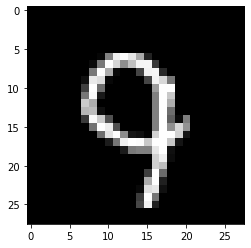

In [55]:
!pip install numpy
!pip install matplotlib

import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline 
img = np.array(x_test[999], dtype='float')
pixels = img.reshape((28, 28))
plt.imshow(pixels, cmap='gray')
plt.show()

In [60]:
scoring_data = {"input_data": [{"values": [x_test[999].tolist()]}]}
predictions = wml_client.deployments.score(deployment_uid, scoring_data)

In [61]:
print(json.dumps(predictions, indent=2))

{
  "predictions": [
    {
      "fields": [
        "prediction",
        "prediction_classes",
        "probability"
      ],
      "values": [
        [
          [
            1.5512964637309778e-06,
            9.035675674340382e-08,
            2.8375970941851847e-06,
            1.98018296941882e-05,
            0.00023499035160057247,
            7.270208698173519e-06,
            3.7143621511859237e-09,
            0.0016646222211420536,
            0.0007551127928309143,
            0.9973137974739075
          ],
          9,
          [
            1.5512964637309778e-06,
            9.035675674340382e-08,
            2.8375970941851847e-06,
            1.98018296941882e-05,
            0.00023499035160057247,
            7.270208698173519e-06,
            3.7143621511859237e-09,
            0.0016646222211420536,
            0.0007551127928309143,
            0.9973137974739075
          ]
        ]
      ]
    }
  ]
}


In [62]:
wos_client.data_sets.show_records(payload_data_set_id)

<a id="explainability"></a>
## 4. Explainability

### 4.1 Configure Explainability

In [48]:
target = Target(
    target_type=TargetTypes.SUBSCRIPTION,
    target_id=subscription_id
)
parameters = {
    "enabled": True
}
explainability_details = wos_client.monitor_instances.create(
    data_mart_id=data_mart_id,
    background_mode=False,
    monitor_definition_id=wos_client.monitor_definitions.MONITORS.EXPLAINABILITY.ID,
    target=target,
    parameters=parameters
).result

explainability_monitor_id = explainability_details.metadata.id




 Waiting for end of monitor instance creation 02b3bcdb-f5b6-48c0-9e30-b561ff2842bc 




active

---------------------------------------
 Monitor instance successfully created 
---------------------------------------




### 4.2 Get explanation for the transaction

In [49]:
pl_records_resp = wos_client.data_sets.get_list_of_records(data_set_id=payload_data_set_id, limit=1, offset=0).result
scoring_ids = [pl_records_resp["records"][0]["entity"]["values"]["scoring_id"]]
print("Running explanations on scoring IDs: {}".format(scoring_ids))
explanation_types = ["lime", "contrastive"]
result = wos_client.monitor_instances.explanation_tasks(scoring_ids=scoring_ids, explanation_types=explanation_types).result
print(result)

IndexError: list index out of range

In [ ]:
explanation_task_id=result.to_dict()['metadata']['explanation_task_ids'][0]
explanation=wos_client.monitor_instances.get_explanation_tasks(explanation_task_id=explanation_task_id).result.to_dict()

### The explanation images can be obtained using the cells below

In [ ]:
!pip install Pillow
from PIL import Image
import base64
import io

img = explanation["entity"]['explanations'][0]['predictions'][0]["explanation"][0]["full_image"]
img_data = base64.b64decode(img)
Image.open(io.BytesIO(img_data))

In [ ]:
img = explanation["entity"]['explanations'][0]['predictions'][1]["explanation"][0]["full_image"]
img_data = base64.b64decode(img)
Image.open(io.BytesIO(img_data))